# Homework 3. Dense Prediction (50 points)
---
In this part, you will study a problem of segmentation. The goal of this assignment is to study, implement, and compare different components of dense prediction models, including **data augmentation**, **backbones**, **classifiers** and **losses**.

This assignment will require training multiple neural networks, therefore it is advised to use a **GPU** accelerator.

<font color='red'>**In this task, it is obligatory to provide accuracy plots on the training and validation datasets obtained during training, as well as examples of the work of each of the models on the images. Without plots, your work will get 0 points. Writing a report is just as important as writing code.**</font>

**<font color='red'>Before the submission please convert your notebook to .py file and check that it runs correctly. How to get .py file in Colab: File -> Download -> Download .py**

In [ ]:
# !pip install -U gdown
!pip install pytorch_lightning

     |████████████████████████████████| 582 kB 5.3 MB/s 
     |████████████████████████████████| 398 kB 36.4 MB/s 
     |████████████████████████████████| 136 kB 13.7 MB/s 
     |████████████████████████████████| 596 kB 34.2 MB/s 
     |████████████████████████████████| 1.1 MB 10.8 MB/s 
     |████████████████████████████████| 94 kB 1.5 MB/s 
     |████████████████████████████████| 144 kB 39.1 MB/s 
     |████████████████████████████████| 271 kB 35.0 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
# Determine the locations of auxiliary libraries and datasets.
# `AUX_DATA_ROOT` is where 'tiny-imagenet-2022.zip' is.

# Detect if we are in Google Colaboratory
try:
    import google.colab
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

from pathlib import Path
if IN_COLAB:
    google.colab.drive.mount("/content/drive")
    
    # Change this if you created the shortcut in a different location
    AUX_DATA_ROOT = Path("/content/drive/My Drive/HW2")
    
    assert AUX_DATA_ROOT.is_dir(), "Have you forgot to 'Add a shortcut to Drive'?"
    
    import sys
    sys.path.append(str(AUX_DATA_ROOT))
else:
    AUX_DATA_ROOT = Path(".")

Mounted at /content/drive


In [ ]:
AUX_DATA_ROOT

PosixPath('/content/drive/My Drive/HW2')

In [ ]:
# pass a python variable to console in brckets {}
!ls {'"%s"' % AUX_DATA_ROOT}

hw2-semantic_segmentation-Surname-Name-attempt-1.ipynb
materials
Part2
tiny-floodnet-challenge.tar.gz


In [ ]:
# Uncomment and run if in Colab
!mkdir datasets
!cp '{AUX_DATA_ROOT}/tiny-floodnet-challenge.tar.gz' datasets/tiny-floodnet-challenge.tar.gz
!tar -xzf datasets/tiny-floodnet-challenge.tar.gz -C datasets
!rm datasets/tiny-floodnet-challenge.tar.gz



In [ ]:
!ls datasets/tiny-floodnet-challenge

test  train


## Dataset

We will use a simplified version of a [FloodNet Challenge](http://www.classic.grss-ieee.org/earthvision2021/challenge.html).

Compared to the original challenge, our version doesn't have difficult (and rare) "flooded" labels, and the images are downsampled

<img src="https://i.imgur.com/RZuVuVp.png" />

## Assignments and grading


- **Part 1. Code**: fill in the empty gaps (marked with `#TODO`) in the code of the assignment (34 points):
    - `dataset` -- 4 points
    - `model` -- 20 points
    - `loss` -- 8 points
    - `train` -- 2 points
- **Part 2. Train and benchmark** the performance of the required models (6 points):
    - All 6 checkpoints are provided -- 3 points
    - Checkpoints have > 0.5 accuracy -- 3 points
- **Part 3. Report** your findings (10 points)
    - Each task -- 2.5 points

- **Total score**: 50 points.

For detailed grading of each coding assignment, please refer to the comments inside the files. Please use the materials provided during a seminar and during a lecture to do a coding part, as this will help you to further familiarize yourself with PyTorch. Copy-pasting the code from Google Search will get penalized.

In part 2, you should upload all your pre-trained checkpoints to your personal Google Drive, grant public access and provide a file ID, following the intructions in the notebook.

Note that for each task in part 3 to count towards your final grade, you should complete the corresponding tasks in part 2.

For example, if you are asked to compare Model X and Model Y, you should provide the checkpoints for these models in your submission, and their accuracies should be above minimal threshold.

## Part 1. Code


### `dataset`
**TODO: implement and apply data augmentations**

You'll need to study a popular augmentations library: [Albumentations](https://albumentations.ai/), and implement the requested augs. Remember that geometric augmentations need to be applied to both images and masks at the same time, and Albumentations has [native support](https://albumentations.ai/docs/getting_started/mask_augmentation/) for that.

In [ ]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from torchvision.transforms import ToTensor
import os
from PIL import Image
import numpy as np
import torch



class FloodNet(Dataset):
    """
    Labels semantic:
    0: Background, 1: Building, 2: Road, 3: Water, 4: Tree, 5: Vehicle, 6: Pool, 7: Grass
    """
    def __init__(
        self,
        data_path: str,
        phase: str,
        augment: bool,
        img_size: int,
    ):
        self.num_classes = 8
        self.data_path = data_path
        self.phase = phase
        self.augment = augment
        self.img_size = img_size

        self.items = [filename.split('.')[0] for filename in os.listdir(f'{data_path}/{phase}/image')]
        
        # TODO: implement augmentations (3.5 points)
        if augment:
            # TODO:
            # Random resize
            # Random crop (within image borders, output size = img_size)
            # Random rotation
            # Random horizontal and vertical Flip
            # Random color augmentation
            self.transform = A.Compose([
                A.augmentations.transforms.RandomSizedCrop((256,256), img_size, img_size),
                A.Rotate(),
                A.HorizontalFlip(),
                A.VerticalFlip(),
                A.RandomBrightnessContrast(),
                A.HueSaturationValue()
            ])

        else:
        	# TODO: random crop to img_size
            self.transform = A.RandomCrop(img_size, img_size)
        
        self.to_tensor = ToTensor()

    def __len__(self):
        return len(self.items)

    def __getitem__(self, index):
        image = np.asarray(Image.open(f'{self.data_path}/{self.phase}/image/{self.items[index]}.jpg'))
        mask = np.asarray(Image.open(f'{self.data_path}/{self.phase}/mask/{self.items[index]}.png'))
        
        if self.phase == 'train':
        	# TODO: apply transform to both image and mask (0.5 points)
            transformed = self.transform(image=image, mask=mask)
            image = transformed['image']
            mask = transformed['mask']
        
        image = self.to_tensor(image.copy())
        mask = torch.from_numpy(mask.copy()).long()

        if self.phase == 'train':
            assert isinstance(image, torch.FloatTensor) and image.shape == (3, self.img_size, self.img_size)
            assert isinstance(mask, torch.LongTensor) and mask.shape == (self.img_size, self.img_size)

        return image, mask

### `model`
**TODO: Implement the required models.**

Typically, all segmentation networks consist of an encoder and decoder. Below is a scheme for a popular DeepLab v3 architecture:

<img src="https://i.imgur.com/cdlkxvp.png" />

The encoder consists of a convolutional backbone, typically with extensive use of convs with dilations (atrous convs) and a head, which helps to further boost the receptive field. As you can see, the general idea for the encoders is to have as big of a receptive field, as possible.

The decoder either does upsampling with convolutions (similarly to the scheme above, or to UNets), or even by simply interpolating the outputs of the encoder.

In this assignment, you will need to implement **UNet** and **DeepLab** models. Example UNet looks like this:

<img src="https://i.imgur.com/uVdcE4e.png" />

For **DeepLab** model we will have three variants for backbones: **ResNet18**, **VGG11 (with BatchNorm)**, and **MobileNet v3 (small).** Use `torchvision.models` to obtain pre-trained versions of these backbones and simply extract their convolutional parts. To familiarize yourself with **MobileNet v3** model, follow this [link](https://paperswithcode.com/paper/searching-for-mobilenetv3).

We will also use **Atrous Spatial Pyramid Pooling (ASPP)** head. Its scheme can be seen in the DeepLab v3 architecture above. ASPP is one of the blocks which greatly increases the spatial size of the model, and hence boosts the model's performance. For more details, you can refer to this [link](https://paperswithcode.com/method/aspp).

In [ ]:
import torch
from torch import nn
from torch.nn import functional as F
from torchvision import models



class UNet(nn.Module):
    """
    TODO: 8 points

    A standard UNet network (with padding in covs).

    For reference, see the scheme in materials/unet.png
    - Use batch norm between conv and relu
    - Use max pooling for downsampling
    - Use conv transpose with kernel size = 3, stride = 2, padding = 1, and output padding = 1 for upsampling
    - Use 0.5 dropout after concat

    Args:
      - num_classes: number of output classes
      - min_channels: minimum number of channels in conv layers
      - max_channels: number of channels in the bottleneck block
      - num_down_blocks: number of blocks which end with downsampling

    The full architecture includes downsampling blocks, a bottleneck block and upsampling blocks

    You also need to account for inputs which size does not divide 2**num_down_blocks:
    interpolate them before feeding into the blocks to the nearest size which divides 2**num_down_blocks,
    and interpolate output logits back to the original shape
    """
    def __init__(self, 
                 num_classes,
                 min_channels=32,
                 max_channels=512, 
                 num_down_blocks=4):
        super(UNet, self).__init__()
        self.num_classes = num_classes
        # TODO
        self.num_down_blocks = num_down_blocks

        self.down = []
        self.up = []

        self.down.append(DownBlock(3, min_channels))
        for i in range(num_down_blocks):
            self.down.append(DownBlock(int(min_channels*(2**i)), int(min_channels*(2**(i+1)))))
            self.up.append(UpBlock(int(max_channels/(2**i)), int(max_channels/(2**(i+1)))))
        self.up.append(UpBlock(min_channels, min_channels))

        self.down = nn.ModuleList(self.down)
        self.up = nn.ModuleList(self.up)
        self.bottleneck = ConvBlock(max_channels, max_channels)
        self.out = nn.Conv2d(min_channels, num_classes, 1)
        self.sigm = nn.Sigmoid()

    def forward(self, inputs):
        factor1 = (2**(self.num_down_blocks+1)) * np.round(inputs.shape[2] / (2**(self.num_down_blocks+1))) / inputs.shape[2]
        factor2 = (2**(self.num_down_blocks+1)) * np.round(inputs.shape[3] / (2**(self.num_down_blocks+1))) / inputs.shape[3]
        outputs = F.interpolate(inputs, scale_factor=(factor1, factor2))

        down_outputs = []
        for down in self.down:
            outputs, x_cat = down(outputs)
            down_outputs.append(x_cat)

        outputs = self.bottleneck(outputs)
        down_outputs.reverse()

        for up, x_cat in zip(self.up, down_outputs):
            outputs = up(x_cat, outputs)

        outputs = self.out(outputs)

        outputs = F.interpolate(outputs, scale_factor=(1 / factor1, 1 / factor2))

        logits = self.sigm(outputs) #TODO

        assert logits.shape == (inputs.shape[0], self.num_classes, inputs.shape[2], inputs.shape[3]), 'Wrong shape of the logits'
        return logits

class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.layer = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )

    def forward(self, x):
        return self.layer(x)
    
class UpBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_channels, in_channels, 3, stride=2, padding=1, output_padding=1)
        self.layer = nn.Sequential(
            nn.Dropout2d(),
            ConvBlock(in_channels * 2, out_channels)
        )

    def forward(self, x1, x2):
        x2 = self.up(x2)
        x = torch.cat((x1, x2), dim=1)

        return self.layer(x)

class DownBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.pool = nn.MaxPool2d(kernel_size=2)
        self.conv = ConvBlock(in_channels, out_channels)

    def forward(self, x):
        x2 = self.conv(x)
        x1 = self.pool(x2)
        return x1, x2


class DeepLab(nn.Module):
    """
    TODO: 6 points

    (simplified) DeepLab segmentation network.
    
    Args:
      - backbone: ['resnet18', 'vgg11_bn', 'mobilenet_v3_small'],
      - aspp: use aspp module
      - num classes: num output classes

    During forward pass:
      - Pass inputs through the backbone to obtain features
      - Apply ASPP (if needed)
      - Apply head
      - Upsample logits back to the shape of the inputs
    """
    def __init__(self, backbone, aspp, num_classes):
        super(DeepLab, self).__init__()
        self.backbone = backbone
        self.num_classes = num_classes
        self.init_backbone()

        if aspp:
            self.aspp = ASPP(self.out_features, 256, [12, 24, 36])
        else:
            self.aspp = aspp

        self.head = DeepLabHead(self.out_features, num_classes)

    def init_backbone(self):
        # TODO: initialize an ImageNet-pretrained backbone
        if self.backbone == 'resnet18':
            model = models.resnet18(pretrained=True)
            layers = []
            layers.append(model.conv1)
            layers.append(model.bn1)
            layers.append(model.relu)
            layers.append(model.maxpool)
            layers.append(model.layer1)
            layers.append(model.layer2)
            layers.append(model.layer3)
            layers.append(model.layer4)
            self.layers = nn.Sequential(*layers) 
            self.out_features = 512 # TODO: number of output features in the backbone
            
        elif self.backbone == 'vgg11_bn':
            self.layers = models.vgg11_bn(pretrained=True).features 
            self.out_features = 512 # TODO

        elif self.backbone == 'mobilenet_v3_small':
            self.layers = models.mobilenet_v3_small(pretrained=True).features
            self.out_features = 576 # TODO

    def _forward(self, x):
        # TODO: forward pass through the backbone
        if self.backbone == 'resnet18':
            x = self.layers(x)

        elif self.backbone == 'vgg11_bn':
            x = self.layers(x)

        elif self.backbone == 'mobilenet_v3_small':
            x = self.layers(x)

        return x

    def forward(self, inputs):
        logits = self._forward(inputs)
        if self.aspp:
            logits = self.aspp(logits)
        logits = self.head(logits)
        up = nn.Upsample(size=(inputs.shape[2], inputs.shape[3]), mode='bilinear')
        logits = up(logits) # TODO

        assert logits.shape == (inputs.shape[0], self.num_classes, inputs.shape[2], inputs.shape[3]), 'Wrong shape of the logits'
        return logits


class DeepLabHead(nn.Sequential):
    def __init__(self, in_channels, num_classes):
        super(DeepLabHead, self).__init__(
            nn.Conv2d(in_channels, in_channels, 3, padding=1, bias=False),
            nn.BatchNorm2d(in_channels),
            nn.ReLU(),
            nn.Conv2d(in_channels, num_classes, 1)
        )


class ASPP(nn.Module):
    """
    TODO: 8 points

    Atrous Spatial Pyramid Pooling module
    with given atrous_rates and out_channels for each head
    Description: https://paperswithcode.com/method/aspp
    
    Detailed scheme: materials/deeplabv3.png
      - "Rates" are defined by atrous_rates
      - "Conv" denotes a Conv-BN-ReLU block
      - "Image pooling" denotes a global average pooling, followed by a 1x1 "conv" block and bilinear upsampling
      - The last layer of ASPP block should be Dropout with p = 0.5

    Args:
      - in_channels: number of input and output channels
      - num_channels: number of output channels in each intermediate "conv" block
      - atrous_rates: a list with dilation values
    """
    def __init__(self, in_channels, num_channels, atrous_rates):
        super(ASPP, self).__init__()

        layers = [nn.Sequential(nn.Conv2d(in_channels, num_channels, kernel_size=1),
                  nn.BatchNorm2d(num_channels),
                  nn.ReLU())]
        for rate in atrous_rates:
            layers.append(nn.Sequential(
                nn.Conv2d(in_channels, num_channels, kernel_size=3, dilation=rate, padding='same'),
                nn.BatchNorm2d(num_channels),
                nn.ReLU())
            )
        layers.append(nn.Sequential(nn.AdaptiveAvgPool2d(1),
                      nn.Conv2d(in_channels, num_channels, 1),
                      nn.BatchNorm2d(num_channels),
                      nn.ReLU()))
        
        self.layers = nn.ModuleList(layers)
        self.conv1 = nn.Sequential(
                nn.Conv2d(num_channels * (len(atrous_rates)+2), in_channels, kernel_size=1),
                nn.BatchNorm2d(in_channels),
                nn.ReLU(),
                nn.Dropout()
        )

    def forward(self, x):
        # TODO: forward pass through the ASPP module
        res = []
        for layer in self.layers:
            # layer = layer.cuda()
            res.append(layer(x))
        up = nn.Upsample(size=(x.shape[2], x.shape[3]), mode='bilinear')
        res[-1] = up(res[-1])
        res = self.conv1(torch.cat(res, dim=1))
        
        assert res.shape[1] == x.shape[1], 'Wrong number of output channels'
        assert res.shape[2] == x.shape[2] and res.shape[3] == x.shape[3], 'Wrong spatial size'
        return res

### `loss`
**TODO: implement test losses.**

For validation, we will use three metrics. 
- Mean intersection over union: **mIoU**,
- Mean class accuracy: **classAcc**,
- Accuracy: **Acc**.

To calculate **IoU**, use this formula for binary segmentation masks for each class, and then average w.r.t. all classes:

$$ \text{IoU} = \frac{ \text{area of intersection} }{ \text{area of union} } = \frac{ \| \hat{m} \cap m  \| }{ \| \hat{m} \cup m \| }, \quad \text{$\hat{m}$ — predicted binary mask},\ \text{$m$ — target binary mask}.$$

Generally, we want our models to optimize accuracy since this implies that it makes little mistakes. However, most of the segmentation problems have imbalanced classes, and therefore the models tend to underfit the rare classes. Therefore, we also need to measure the mean performance of the model across all classes (mean IoU or mean class accuracy). In reality, these metrics (not the accuracy) are the go-to benchmarks for segmentation models.

In [ ]:
def calc_val_data(preds, masks, num_classes):
    preds = torch.argmax(preds, dim=1)
    preds_b = F.one_hot(preds, num_classes=num_classes).bool()
    masks_b = F.one_hot(masks, num_classes=num_classes).bool()
    
    intersection = (preds_b & masks_b).sum(dim=(1,2)) # TODO: calc intersection for each class
    union = (preds_b | masks_b).sum(dim=(1,2)) # TODO: calc union for each class
    target = masks_b.sum(dim=(1,2)) # TODO: calc number of pixels in groundtruth mask per class
    # Output shapes: B x num_classes

    assert isinstance(intersection, torch.Tensor), 'Output should be a tensor'
    assert isinstance(union, torch.Tensor), 'Output should be a tensor'
    assert isinstance(target, torch.Tensor), 'Output should be a tensor'
    
    assert intersection.shape == union.shape == target.shape, 'Wrong output shape'
    assert union.shape[0] == masks.shape[0] and union.shape[1] == num_classes, 'Wrong output shape'

    return intersection, union, target

def calc_val_loss(intersection, union, target, eps = 1e-7):
    mean_iou = (intersection / (union + eps)).mean(dim=1) # TODO: calc mean class iou
    mean_class_rec = (intersection / (target + eps)).mean(dim=1) # TODO: calc mean class recall
    mean_acc = torch.sum(intersection) / torch.sum(target) # TODO: calc mean accuracy

    return mean_iou, mean_class_rec, mean_acc

### `train`
**TODO: define optimizer and learning rate scheduler.**

You need to experiment with different optimizers and schedulers and pick one of each which works the best. Since the grading will be partially based on the validation performance of your models, we strongly advise doing some preliminary experiments and pick the configuration with the best results.

In [ ]:
# Copyright The PyTorch Lightning team.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Modifications Copyright Skoltech Deep Learning Course.

import torch
import torch.nn.functional as F
import pytorch_lightning as pl
from torch.utils.data import DataLoader


class SegModel(pl.LightningModule):
    def __init__(
        self,
        model: str,
        backbone: str,
        aspp: bool,
        augment_data: bool,
        optimizer: str = 'default',
        scheduler: str = 'default',
        lr: float = None,
        batch_size: int = 16,
        data_path: str = 'datasets/tiny-floodnet-challenge',
        image_size: int = 256,
    ):
        super(SegModel, self).__init__()
        self.num_classes = 8

        if model == 'unet':
            self.net = UNet(self.num_classes)
        elif model == 'deeplab':
            self.net = DeepLab(backbone, aspp, self.num_classes)

        self.train_dataset = FloodNet(data_path, 'train', augment_data, image_size)
        self.test_dataset = FloodNet(data_path, 'test', augment_data, image_size)

        self.batch_size = batch_size
        self.optimizer = optimizer
        self.scheduler = scheduler
        self.lr = lr
        self.eps = 1e-7

        # Visualization
        self.color_map = torch.FloatTensor(
            [[0, 0, 0], [0, 0, 1], [0, 1, 0], [0, 1, 1],
             [1, 0, 0], [1, 0, 1], [1, 1, 0], [1, 1, 1]])

    def forward(self, x):
        return self.net(x)

    def training_step(self, batch, batch_idx):
        img, mask = batch
        pred = self.forward(img)

        train_loss = F.cross_entropy(pred, mask)

        self.log('train_loss', train_loss, prog_bar=True)

        intersection, union, target = calc_val_data(pred, mask, self.num_classes)
        mean_iou, mean_class_rec, mean_acc = calc_val_loss(intersection, union, target, self.eps)

        self.log('train_mean_acc', mean_acc, prog_bar=True)

        return train_loss

    def validation_step(self, batch, batch_idx):
        img, mask = batch
        pred = self.forward(img)

        val_loss = F.cross_entropy(pred, mask)

        self.log('val_loss', val_loss, prog_bar=True)

        intersection, union, target = calc_val_data(pred, mask, self.num_classes)

        return {'intersection': intersection, 'union': union, 'target': target, 'img': img, 'pred': pred, 'mask': mask}

    def validation_epoch_end(self, outputs):
        intersection = torch.cat([x['intersection'] for x in outputs])
        union = torch.cat([x['union'] for x in outputs])
        target = torch.cat([x['target'] for x in outputs])

        mean_iou, mean_class_rec, mean_acc = calc_val_loss(intersection, union, target, self.eps)

        log_dict = {'val_mean_iou': mean_iou, 'val_mean_class_rec': mean_class_rec, 'val_mean_acc': mean_acc}

        for k, v in log_dict.items():
            self.log(k, v, prog_bar=True)

        # Visualize results
        img = torch.cat([x['img'] for x in outputs]).cpu()
        pred = torch.cat([x['pred'] for x in outputs]).cpu()
        mask = torch.cat([x['mask'] for x in outputs]).cpu()

        pred_vis = self.visualize_mask(torch.argmax(pred, dim=1))
        mask_vis = self.visualize_mask(mask)

        results = torch.cat(torch.cat([img, pred_vis, mask_vis], dim=3).split(1, dim=0), dim=2)
        results_thumbnail = F.interpolate(results, scale_factor=0.25, mode='bilinear')[0]

        self.logger.experiment.add_image('results', results_thumbnail, self.current_epoch)

    def visualize_mask(self, mask):
        b, h, w = mask.shape
        mask_ = mask.view(-1)

        if self.color_map.device != mask.device:
            self.color_map = self.color_map.to(mask.device)

        mask_vis = self.color_map[mask_].view(b, h, w, 3).permute(0, 3, 1, 2).clone()

        return mask_vis

    def configure_optimizers(self):
        # TODO: 2 points
        # Use self.optimizer and self.scheduler to call different optimizers
        if self.optimizer == 'default':
            opt = torch.optim.Adam(self.net.parameters(), lr=self.lr, weight_decay=0.0001) # TODO: init optimizer
        else:
            opt = self.optimizer # TODO: init optimizer
        if self.scheduler == 'default':
            sch = torch.optim.lr_scheduler.StepLR(opt, 30, gamma=0.1, last_epoch=-1)
        else:
            sch = self.scheduler # TODO: init learning rate scheduler
        return [opt], [sch]

    def train_dataloader(self):
        return DataLoader(self.train_dataset, num_workers=2, batch_size=self.batch_size, shuffle=True)

    def val_dataloader(self):
        return DataLoader(self.test_dataset, num_workers=2, batch_size=1, shuffle=False)

## Part 2. Train and benchmark

In this part of the assignment, you need to train the following models and measure their training time:
- **UNet** (with and without data augmentation),
- **DeepLab** with **ResNet18** backbone (with **ASPP** = True and False),
- **DeepLab** with the remaining backbones you implemented and **ASPP** = True).

To get the full mark for this assignment, all the required models should be trained (and their checkpoints provided), and have at least 0.5 accuracies.

After the models are trained, evaluate their inference time on both GPU and CPU.

Example training and evaluation code are below.

In [ ]:
import pytorch_lightning as pl
# from semantic_segmentation.train import SegModel
import time
import torch


def define_model(model_name: str, 
                 backbone: str, 
                 aspp: bool, 
                 augment_data: bool, 
                 optimizer: str, 
                 scheduler: str, 
                 lr: float, 
                 checkpoint_name: str = '', 
                 batch_size: int = 16):
    assignment_dir = 'semantic_segmentation'
    experiment_name = f'{model_name}_{backbone}_augment={augment_data}_aspp={aspp}'
    model_name = model_name.lower()
    backbone = backbone.lower() if backbone is not None else backbone
    
    model = SegModel(
        model_name, 
        backbone, 
        aspp, 
        augment_data,
        optimizer,
        scheduler,
        lr,
        batch_size, 
        data_path='datasets/tiny-floodnet-challenge', 
        image_size=256)

    if checkpoint_name:
        model.load_state_dict(torch.load(f'{checkpoint_name}')['state_dict'])
    
    return model, experiment_name

def train(model, experiment_name, use_gpu):
    assignment_dir = 'semantic_segmentation'

    logger = pl.loggers.TensorBoardLogger(save_dir=f'{assignment_dir}/logs', name=experiment_name)

    checkpoint_callback = pl.callbacks.ModelCheckpoint(
        monitor='val_mean_iou',
        dirpath=f'{assignment_dir}/logs/{experiment_name}',
        filename='{epoch:02d}-{val_mean_iou:.3f}',
        mode='max')
    
    trainer = pl.Trainer(
        max_epochs=50, 
        gpus=1 if use_gpu else None, 
        benchmark=True, 
        check_val_every_n_epoch=5, 
        logger=logger, 
        callbacks=[checkpoint_callback])

    time_start = time.time()
    
    trainer.fit(model)
    
    torch.cuda.synchronize()
    time_end = time.time()
    
    training_time = (time_end - time_start) / 60
    
    return training_time

In [ ]:
model, experiment_name = define_model(
    model_name='deeplab', #deeplab UNet
    backbone='mobilenet_v3_small', #resnet18 vgg11_bn mobilenet_v3_small
    aspp=True,
    augment_data=False,
    optimizer='default', # use these options to experiment
    scheduler='default', # with optimizers and schedulers
    lr=0.0001) # experiment to find the best LR
training_time = train(model, experiment_name, use_gpu=True)

print(f'Training time: {training_time:.3f} minutes')

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:608: UserWarning: Checkpoint directory /content/semantic_segmentation/logs/deeplab_mobilenet_v3_small_augment=False_aspp=True exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name | Type    | Params
---------------------------------
0 | net  | DeepLab | 8.9 M 
---------------------------------
8.9 M     Trainable params
0         Non-trainable params
8.9 M     Total params
35.751    Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1931: PossibleUserWarning: The number of training batches

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Training time: 9.340 minutes


After training, the loss curves and validation images with their segmentation masks can be viewed using the TensorBoard extension:

In [ ]:
%load_ext tensorboard
%tensorboard --logdir semantic_segmentation --host localhost

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1117), started 0:48:43 ago. (Use '!kill 1117' to kill it.)

<IPython.core.display.Javascript object>

Inference time can be measured via the following function:

In [ ]:
# Determine the locations of auxiliary libraries and datasets.
# `AUX_DATA_ROOT` is where 'tiny-imagenet-2022.zip' is.

# Detect if we are in Google Colaboratory
try:
    import google.colab
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

from pathlib import Path
if IN_COLAB:
    google.colab.drive.mount("/content/drive")
    
    # Change this if you created the shortcut in a different location
    AUX_DATA_ROOT = Path("/content/drive/My Drive/HW2_checkpoints")
    
    assert AUX_DATA_ROOT.is_dir(), "Have you forgot to 'Add a shortcut to Drive'?"
    
    import sys
    sys.path.append(str(AUX_DATA_ROOT))
else:
    AUX_DATA_ROOT = Path(".")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def calc_inference_time(model, device, input_shape=(1000, 750), num_iters=100):
    timings = []

    for i in range(num_iters):
        x = torch.randn(1, 3, *input_shape).to(device)
        time_start = time.time()
        
        model(x)
        
        torch.cuda.synchronize()
        time_end = time.time()
        
        timings.append(time_end - time_start)

    return sum(timings) / len(timings) * 1e3


model, _ = define_model(
    model_name='deeplab',
    backbone='mobilenet_v3_small',
    aspp=True,
    augment_data=False,
    optimizer='default', # use these options to experiment
    scheduler='default', # with optimizers and schedulers
    lr=0.0001,
    checkpoint_name='drive/My Drive/HW2_checkpoints/deeplab mobilenet aspp epoch=39-val_mean_iou=0.280.ckpt')

# inference_time = calc_inference_time(model.eval().cpu(), 'cpu')
inference_time = calc_inference_time(model.eval().cuda(), 'cuda')

print(f'Inference time (per frame): {inference_time:.3f} ms')

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


Inference time (per frame): 29.798 ms


Your trained weights are available in the `part1_semantic_segmentation/logs` folder. Inside, your experiment directory has a log file with the following mask: `{epoch:02d}-{mean_iou:.3f}.ckpt`. <font color='red'>**Make sure that you models satisfy the accuracy requirements, upload them to your personal Google Drive, and provide a link to google drive folder**.

Here is the link to Google Drive: https://drive.google.com/drive/folders/1ZuOHl1AvUBXnAZwtrn6vpZ9s8ppBWkl8?usp=sharing

In [ ]:
checkpoint_names = {
    'UNet_None_augment=False_aspp=None.ckpt',
    'UNet_None_augment=True_aspp=None.ckpt',
    'DeepLab_ResNet18_augment=True_aspp=False.ckpt',
    'DeepLab_ResNet18_augment=True_aspp=True.ckpt',
    'DeepLab_VGG11_bn_augment=True_aspp=True.ckpt',
    'DeepLab_MobileNet_v3_small_augment=True_aspp=True.ckpt',
}

## Part 3. Report

You should have obtained 7 different models, which we will use for the comparison and evaluation. When asked to visualize specific loss curves, simply configure these plots in TensorBoard, screenshot, store them in the `report` folder, and load into Jupyter markdown:

`<img src="./part1_semantic_segmentation/report/<screenshot_filename>"/>`

If you have problems loading these images, try uploading them [here](https://imgur.com) and using a link as `src`. Do not forget to include the raw files in the `report` folder anyways.

You should make sure that your plots satisfy the following requirements:
- Each plot has a title,
- If there are multiple curves on one plot (or dots on the scatter plot), the plot legend should also be present,
- If the plot is not obtained using TensorBoard (Task 3), the axis should have names and ticks.

<font color='red'>**In this task, it is obligatory to provide accuracy plots on the training and validation datasets obtained during training, as well as examples of the work of each of the models on the images. Without plots, your work will get 0 points. Writing a report is just as important as writing code.**</font>

You can find all the pictures in the report folder (see Google Drive)

#### Task 1.
Visualize training loss and validation loss curves for UNet trained with and without data augmentation. What are the differences in the behavior of these curves between these experiments, and what are the reasons?

UNet (without data augmentation)
<img src="semantic_segmentation\report\UNet_None_augment=False_train_loss.jpg"/>
UNet (with data augmentation)
<img src="semantic_segmentation\report\UNet_None_augment=True_train_loss.jpg"/>
There are much more fluctuations in train loss for UNet trained with data augmentation -- I suppose the reason for this may be in color changes in augmentation. In this task it's important to correctly define classes also using colors (water, grass, buildings, etc.), so probably because of this training wasn't really stable. And other augmentations also add some noise to usual pictures which may cause fluctuations

UNet (without data augmentation)
<img src="semantic_segmentation\report\UNet_None_augment=False_val_loss.jpg"/>
UNet (with data augmentation)
<img src="semantic_segmentation\report\UNet_None_augment=True_val_loss.jpg"/>

These two lines are quite similar, probably because both algorithms (despite of fluctuations during training) are quite good for usual pictures which we receive in validation set

#### Task 2.
Visualize training and validation loss curves for ResNet18 trained with and without ASPP. Which model performs better?

ResNet18 (without ASPP)
<img src="semantic_segmentation\report\DeepLab_ResNet18_aspp=False_train_loss.jpg"/>
ResNet18 (with ASPP)
<img src="semantic_segmentation\report\DeepLab_ResNet18_aspp=True_train_loss.jpg"/>
Despite the fact that we can't control axes of Tensorboard I saved some numbers from training and the final numbers for train loss are 0.233 for model without ASPP and 0.169 for model with ASPP. Now we can imagine what it the schedule of the charts. So from quality point of view model with ASPP is better but it has much more fluctuations and its convergence is a bit worse than in a case of no ASPP
<img src="semantic_segmentation\report\DeepLab_ResNet18_aspp=False_val_loss.jpg"/>
ResNet18 (with ASPP)
<img src="semantic_segmentation\report\DeepLab_ResNet18_aspp=True_val_loss.jpg"/>

Here the values are: 0.989 (no ASPP) and 1.120 (ASPP). Validation loss is crazy in both cases which, here we can't say anything certain about one of the models. Maybe the only thing is that for model with ASPP we have downward trend while in the model with ASPP it is rather upward (which is not good). So from this chart we se the opposite: it seems like model without ASPP is better

#### Task 3.
Compare **UNet** with augmentations and **DeepLab** with all backbones (only experiments with **ASPP**). To do that, put these models on three scatter plots. For the first plot, the x-axis is **training time** (in minutes), for the second plot, the x-axis is **inference time** (in milliseconds), and for the third plot, the x-axis is **model size** (in megabytes). The size of each model is printed by PyTorch Lightning. For all plots, the y-axis is the best **mIoU**. To clarify, each of the **4** requested models should be a single dot on each of these plots.

Which models are the most efficient with respect to each metric on the x-axes? For each of the evaluated models, rate its performance using their validation metrics, training and inference time, and model size. Also for each model explain what are its advantages, and how its performance could be improved?

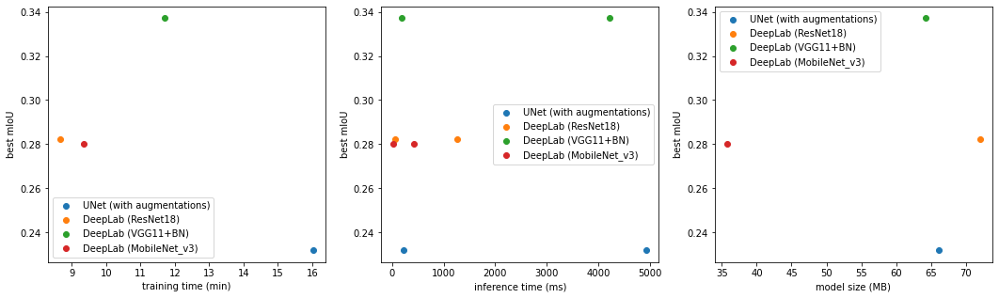

In [19]:
import matplotlib.pyplot as plt
fig, axes = plt.subplots(1, 3, figsize=(18,5))
axes[0].scatter([16.016], [0.2319], label='UNet (with augmentations)')
axes[0].scatter([8.664], [0.2823], label='DeepLab (ResNet18)')
axes[0].scatter([11.696], [0.3371], label='DeepLab (VGG11+BN)')
axes[0].scatter([9.340], [0.28], label='DeepLab (MobileNet_v3)')
axes[0].set_xlabel('training time (min)')
axes[0].set_ylabel('best mIoU')
axes[0].legend()

axes[1].scatter([4934.712, 219.473], [0.2319, 0.2319], label='UNet (with augmentations)')
axes[1].scatter([1256.852, 59.509], [0.2823, 0.2823], label='DeepLab (ResNet18)')
axes[1].scatter([4229.759, 189.986], [0.3371, 0.3371], label='DeepLab (VGG11+BN)')
axes[1].scatter([420.288, 29.798], [0.28, 0.28], label='DeepLab (MobileNet_v3)')
axes[1].set_xlabel('inference time (ms)')
axes[1].set_ylabel('best mIoU')
axes[1].legend()

axes[2].scatter([66.117], [0.2319], label='UNet (with augmentations)')
axes[2].scatter([72.011], [0.2823], label='DeepLab (ResNet18)')
axes[2].scatter([64.209], [0.3371], label='DeepLab (VGG11+BN)')
axes[2].scatter([35.751], [0.28], label='DeepLab (MobileNet_v3)')
axes[2].set_xlabel('model size (MB)')
axes[2].set_ylabel('best mIoU')
axes[2].legend()

For the second chart -- the smaller time is for GPU, the bigger -- for CPU

The most efficient from the training time point of view is DeepLab with ResNet as backbone. As for inference: all models are almost identical when we use GPU but DeepLab with MobileNew is the best. If we use only CPU our winner is MobileNet again -- not surprise since it's small model -- that's why the smallest model size is of MobileNet.

But if we take into account also the performance of the models the rates will be different. UNet lost almost everywhere so it's rather bad model for this task in comparison to others. DeepLab with ResNet is worse than deepLab with ResNet in our case -- we see that they have identical performance in validation metric (mean IOU) and in time consumption. But model with ResNet is much bigger and heavier and this doesn't give any advantage to it. DeepLab with MobileNet and VGG are different and they are hard to be compared: the model with VGG gives much better performance in mean IOU but it is heavier and slower. So the choice of the models depends on our sources (time+memory) in this case.

Advantages of the models (and how models can be improved):
- UNet: no advantadges compare to other models. It's quite easy to implement but it's not worse it in the end. How can be improved: we can try different augmentations, more layers, different parameters of convolutions (to increase receptive field)
- DeepLab (ResNet18): better than UNet, it is faster and gives better quality. But is worse compare to all other models. How can be improved: try option without ASPP, add augmentation, but generally this will be the same model util we change the structure. We can also try other ResNets
- DeepLab (VGG11+BN): the best model from quality point of view (the highest mean IOU). It is rather fast in training (better than UNet) but heavy and slow in inference. How can be improved: the same as with ResNet, try to add augmentation, use wuthout ASPP and try other VGG models
- DeepLab (MobileNet_vs): the best model from speed and memory point of view. It gives not the best quality. How can be improved: all the same -- other MobileNets, augmentation, try to remove ASPP

#### Task 4.

Pick the best model according to **mIoU** and look at the visualized predictions on the validation set in the TensorBoard. For each segmentation class, find the good examples (if they are available), and the failure cases. Provide the zoomed-in examples and their analysis below. Please do not attach full validation images, only the areas of interest which you should crop manually.

<img src="semantic_segmentation\report\DeepLab_VGG11_bn_example1.jpg"/>



This example shows good quality for some classes (road, vehicle, pool, grass) -- pool was found even though the mask doesn't contain it. And bad quality for other classes -- buildings are smoothed and merged, trees as not very good too, some of them are lost.

<img src="semantic_segmentation\report\DeepLab_VGG11_bn_example2.jpg"/>

This example shows good quality for some classes (road, tree, pool) -- pool is more accurate in prediction than in the mask, the same for trees. And bad quality for other classes -- one of vehicles wasn't found, grass os not very accurate

<img src="semantic_segmentation\report\DeepLab_VGG11_bn_example3.jpg"/>

This example shows good quality for some classes (water, building, tree) -- water may be not perfect but it sees the direction and the borders of it. And bad quality for other classes -- pool os too large, it's not correct

**<font color='red'>Before the submission please convert your notebook to .py file and check that it runs correctly. How to get .py file in Colab: File -> Download -> Download .py**
Left side menu in Colab -> Files -> Upload your script
and then check.

In [ ]:
!python hw2_semantic_segmentation_Makhneva_Elizaveta_attempt_1.py

You can replace TODO strings to None